<a href="https://colab.research.google.com/github/diego2017003/processamento-digital-de-imagens---lista-2/blob/main/Pontilhismo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Questão 2.
---
Pontilhismo

In [1]:
import cv2
import numpy as np

### Abrindo a imagem
---

In [2]:
img = cv2.imread("/content/cafe.jpg")

In [3]:
img

array([[[116, 112, 101],
        [122, 118, 107],
        [125, 123, 113],
        ...,
        [ 21,  22,  26],
        [ 21,  22,  26],
        [ 22,  23,  27]],

       [[117, 115, 104],
        [117, 115, 105],
        [118, 116, 106],
        ...,
        [ 21,  22,  26],
        [ 21,  22,  26],
        [ 21,  22,  26]],

       [[119, 116, 108],
        [113, 111, 103],
        [111, 109, 101],
        ...,
        [ 20,  21,  25],
        [ 21,  22,  26],
        [ 21,  22,  26]],

       ...,

       [[ 53,  80, 124],
        [ 55,  80, 124],
        [ 57,  80, 125],
        ...,
        [101, 142, 181],
        [107, 148, 187],
        [111, 152, 191]],

       [[ 56,  81, 125],
        [ 56,  81, 125],
        [ 59,  80, 125],
        ...,
        [ 98, 139, 178],
        [104, 145, 184],
        [108, 149, 188]],

       [[ 56,  81, 125],
        [ 57,  80, 125],
        [ 59,  80, 125],
        ...,
        [ 89, 130, 169],
        [ 95, 136, 175],
        [ 98, 139, 178]]

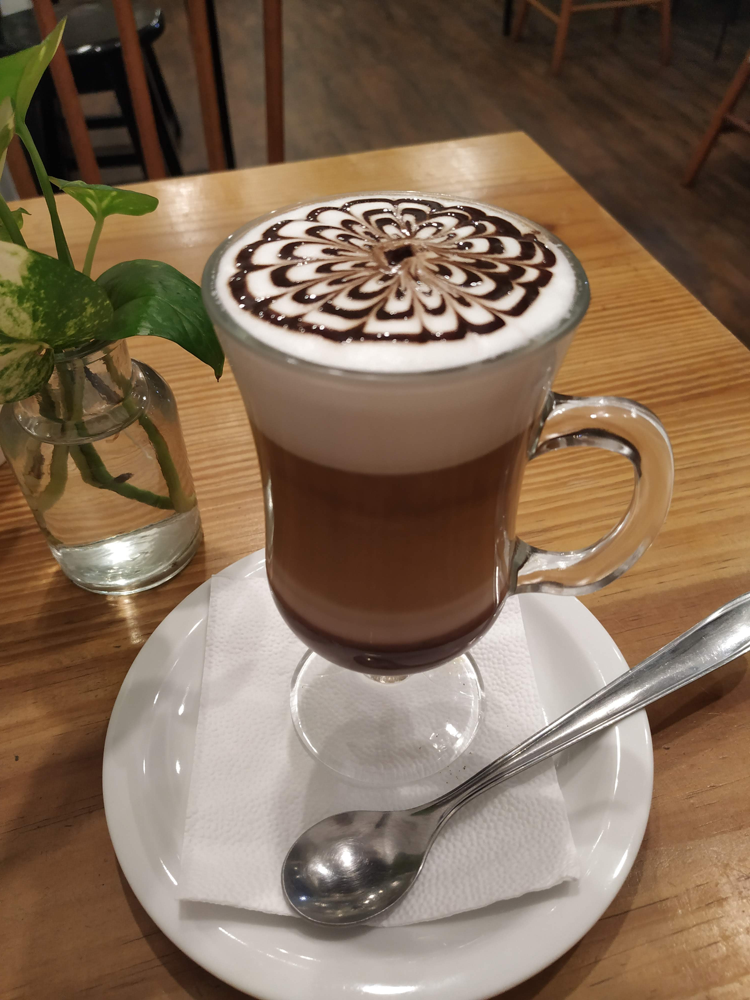

In [4]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

### Aplicando canny
---

In [7]:
t_lower = 8  # Lower Threshold
t_upper = 8  # Upper threshold



blur_img = cv2.GaussianBlur(img,(5,5),0)


  
# Applying the Canny Edge filter
vector_of_cannys = []
vector_of_cannys.append(cv2.Canny(blur_img, 20, 80,apertureSize=5))
#vector_of_cannys.append(cv2.Canny(blur_img, 8, 8,apertureSize=7))

for i in range(1,5,1):
  for j in range(1,3):
    edge_img = cv2.Canny(blur_img, j*t_lower, j*t_upper,apertureSize=3)
    vector_of_cannys.append(edge_img)
    #cv2_imshow(edge_img)
  t_upper = i*t_upper

Varrer as matrizes resultantes do algoritmo de canny para começar o procedimento de pontilhismo

In [8]:
altura = len(img)
largura = len(img[0])

In [9]:
vector_of_cannys2 = vector_of_cannys.copy()
cont = len(vector_of_cannys2)

In [10]:

for indice in range(cont-1,-1,-1):
  for i in range(cont-1,indice,-1):
    vector_of_cannys2[indice] = vector_of_cannys2[indice] - vector_of_cannys2[i]

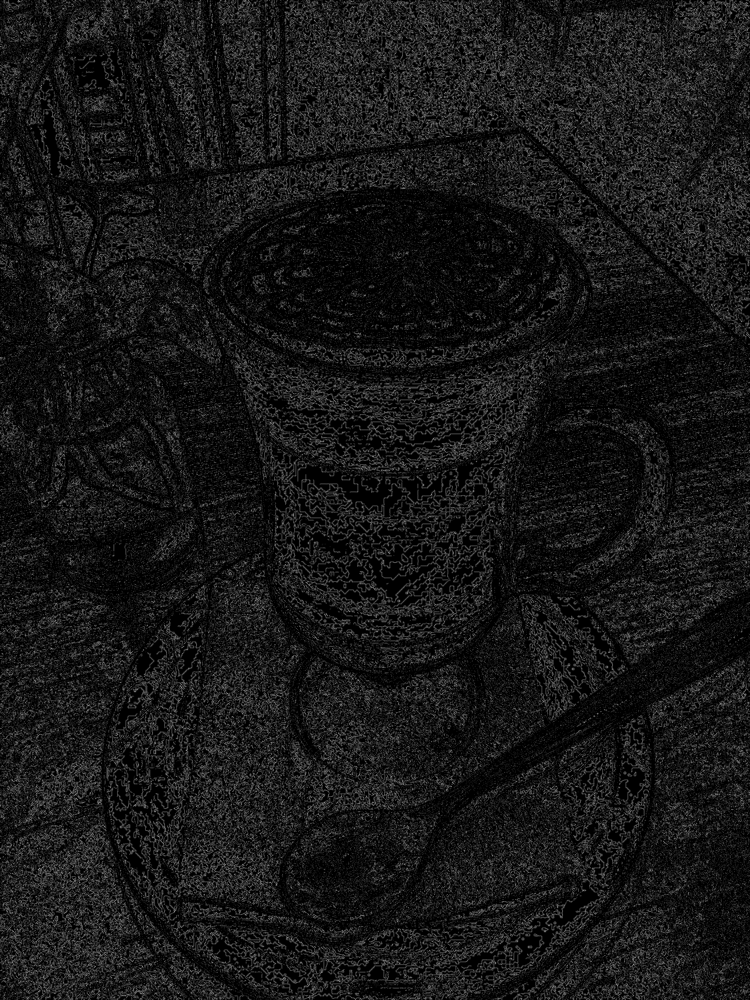

In [11]:
cv2_imshow(vector_of_cannys2[0])

In [12]:
cont = len(vector_of_cannys2)

In [13]:
img2 = img.copy()

In [14]:
tela_branca = img2*0+255
for indice in range(0,cont):
  imagem = vector_of_cannys2[cont-1-indice]
  for i in range(altura):
    for j in range(largura):
      if imagem[i,j] == 255:
        color = (img[i][j][0],img[i][j][1],img[i][j][2])
        cv2.circle(tela_branca, (j, i), (15*(cont-1-indice+2)), (int(img[i][j][0]),int(img[i][j][1]),int(img[i][j][2])), -1)
  #cv2_imshow(tela_branca)

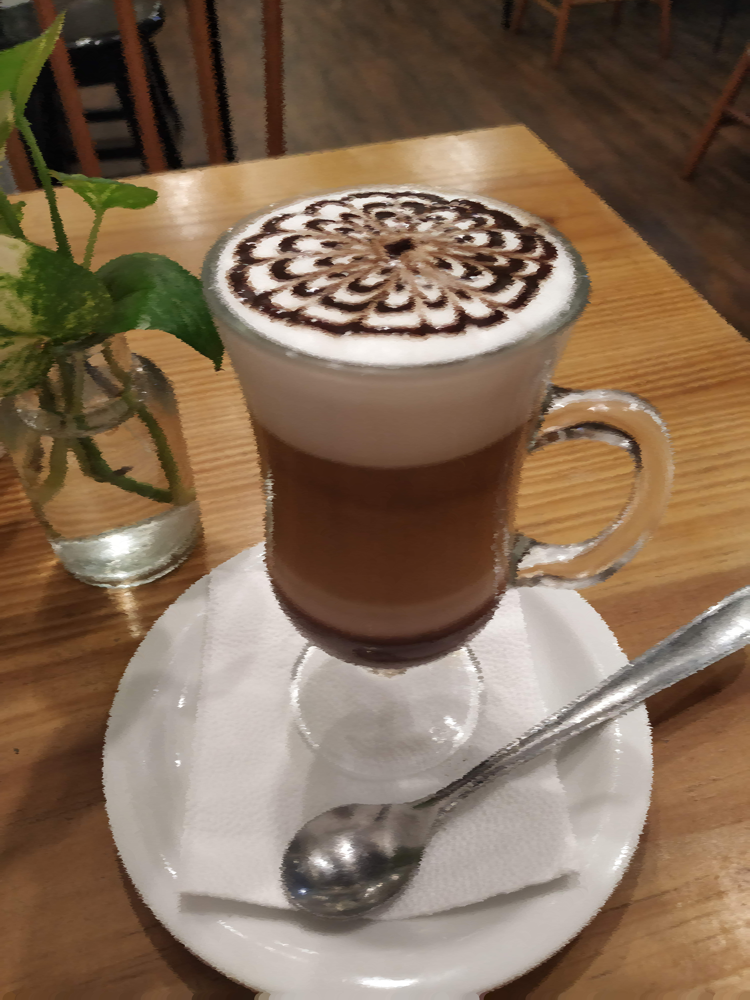

In [15]:
cv2_imshow(tela_branca)